# Pose Detection and Matching with OpenPose

This notebook uses an open source project [CMU-Perceptual-Computing-Lab/openpose](https://github.com/CMU-Perceptual-Computing-Lab/openpose.git) to detect/track multi person poses and similarity matching between those poses.

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/Kasidit0052/MatchingOpenpose/blob/main/OpenPose.ipynb)

## Install OpenPose

In [ ]:
import os
from os.path import exists, join, basename, splitext

git_repo_url = 'https://github.com/CMU-Perceptual-Computing-Lab/openpose.git'
project_name = splitext(basename(git_repo_url))[0]
if not exists(project_name):
  # see: https://github.com/CMU-Perceptual-Computing-Lab/openpose/issues/949
  # install new CMake becaue of CUDA10
  !wget -q https://cmake.org/files/v3.13/cmake-3.13.0-Linux-x86_64.tar.gz
  !tar xfz cmake-3.13.0-Linux-x86_64.tar.gz --strip-components=1 -C /usr/local
  # clone openpose
  !git clone -q --depth 1 $git_repo_url
  !sed -i 's/execute_process(COMMAND git checkout master WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/execute_process(COMMAND git checkout f019d0dfe86f49d1140961f8c7dec22130c83154 WORKING_DIRECTORY ${CMAKE_SOURCE_DIR}\/3rdparty\/caffe)/g' openpose/CMakeLists.txt
  # install system dependencies
  !apt-get -qq install -y libatlas-base-dev libprotobuf-dev libleveldb-dev libsnappy-dev libhdf5-serial-dev protobuf-compiler libgflags-dev libgoogle-glog-dev liblmdb-dev opencl-headers ocl-icd-opencl-dev libviennacl-dev
  # install python dependencies
  !pip install -q youtube-dl
  # build openpose
  !cd openpose && rm -rf build || true && mkdir build && cd build && cmake -DBUILD_PYTHON=ON .. && make -j`nproc`
!mkdir openpose/images openpose/videos

Selecting previously unselected package libgflags2.2.
(Reading database ... 160980 files and directories currently installed.)
Preparing to unpack .../00-libgflags2.2_2.2.1-1_amd64.deb ...
Unpacking libgflags2.2 (2.2.1-1) ...
Selecting previously unselected package libgflags-dev.
Preparing to unpack .../01-libgflags-dev_2.2.1-1_amd64.deb ...
Unpacking libgflags-dev (2.2.1-1) ...
Selecting previously unselected package libgoogle-glog0v5.
Preparing to unpack .../02-libgoogle-glog0v5_0.3.5-1_amd64.deb ...
Unpacking libgoogle-glog0v5 (0.3.5-1) ...
Selecting previously unselected package libgoogle-glog-dev.
Preparing to unpack .../03-libgoogle-glog-dev_0.3.5-1_amd64.deb ...
Unpacking libgoogle-glog-dev (0.3.5-1) ...
Selecting previously unselected package libhdf5-serial-dev.
Preparing to unpack .../04-libhdf5-serial-dev_1.10.0-patch1+docs-4_all.deb ...
Unpacking libhdf5-serial-dev (1.10.0-patch1+docs-4) ...
Selecting previously unselected package libleveldb1v5:amd64.
Preparing to unpack ...

## Detect poses on a test video using openpose example binary

We are going to detect poses on the following video:

In [ ]:
# move workspace and run binary file
!rm openpose.avi
!cd openpose && ./build/examples/openpose/openpose.bin --video ../Video_Names.mp4 --write_json ./output/ --display 0  --write_video ../openpose.avi

# convert the result into MP4
!ffmpeg -y -loglevel info -i openpose.avi output.mp4

Finally, visualize the result:

In [ ]:
def show_local_mp4_video(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))

show_local_mp4_video('output.mp4', width=960, height=720)

# Openpose Python API and Pose Matching Algorithm

### **Openpose Python API Testing**

Run this cell to verify the Openpose Python API Installation

In [ ]:
%cd openpose/build/examples/tutorial_api_python
!python 04_keypoints_from_images.py
%cd ../../..

/content/openpose/build/examples/tutorial_api_python
Starting OpenPose Python Wrapper...
Auto-detecting all available GPUs... Detected 1 GPU(s), using 1 of them starting at GPU 0.
Body keypoints: 
[[[3.2809854e+02 2.1974371e+02 7.5993967e-01]
  [3.2289130e+02 2.1718504e+02 8.3385360e-01]
  [2.9802701e+02 2.2368245e+02 8.8920242e-01]
  [2.7715598e+02 2.5109933e+02 8.6595273e-01]
  [2.9809534e+02 2.7328116e+02 8.2083827e-01]
  [3.4900360e+02 2.1327135e+02 9.2912471e-01]
  [3.6726160e+02 2.3550529e+02 8.7097746e-01]
  [3.6850781e+02 2.6154324e+02 8.3065987e-01]
  [3.2806213e+02 2.8759146e+02 8.6716896e-01]
  [3.1245990e+02 2.8764346e+02 7.8310686e-01]
  [3.2936475e+02 3.3851541e+02 8.6039579e-01]
  [3.3854834e+02 3.9202173e+02 7.7205557e-01]
  [3.3985031e+02 2.8631238e+02 8.6554557e-01]
  [3.4376807e+02 3.3462039e+02 7.7605212e-01]
  [3.4638205e+02 3.7248010e+02 6.3853985e-01]
  [3.2416013e+02 2.1451590e+02 6.8749976e-01]
  [3.3074908e+02 2.1451418e+02 6.3172626e-01]
  [3.1632730e+02 2.04

### **Upload Images**

In [ ]:
import os

# Define Openpose directory destination
OpenposeDir = '/content/openpose/'

# Upload Function
def upload_images():
  from google.colab import files
  uploaded = files.upload()
  output = []
  for k, v in uploaded.items():
    open(k, 'wb').write(v)
    src = os.path.join(OpenposeDir,k)
    destination = os.path.join(OpenposeDir,'images',k)
    os.rename(src,destination)
    output.append(destination)
  return output

images_list = upload_images()
images_list

Saving input.png to input.png
Saving input2.png to input2.png
Saving input3.png to input3.png


['/content/openpose/images/input.png',
 '/content/openpose/images/input2.png',
 '/content/openpose/images/input3.png']

### **Pose Estimation on single Image**

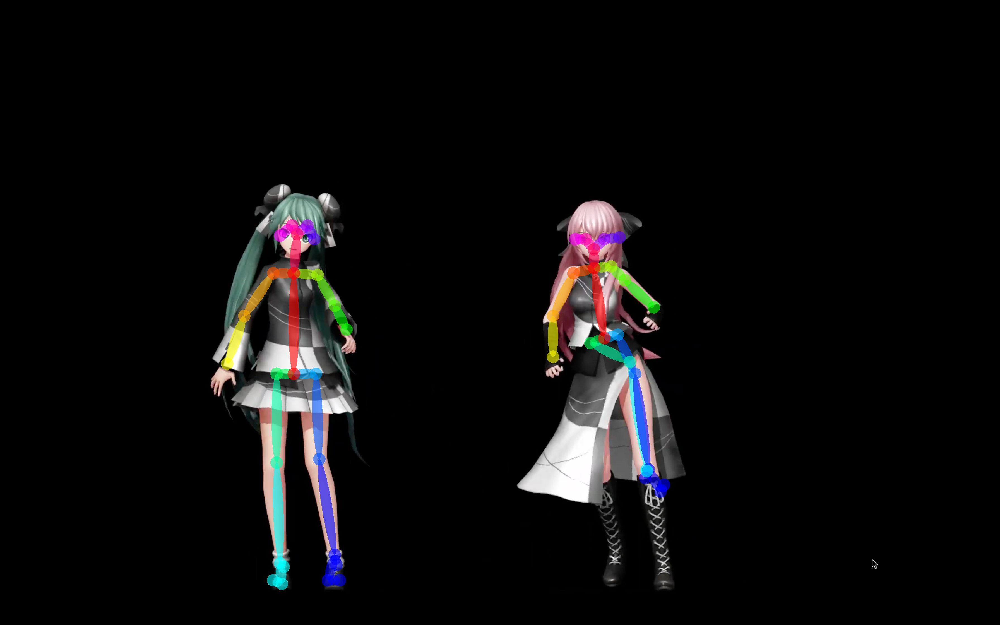

In [ ]:
# Import general libraries
import sys
import cv2
import warnings
from google.colab.patches import cv2_imshow
warnings.simplefilter(action='ignore', category=FutureWarning)

# Set Python Openpose Directory for python api (Important)
pyopenpose_dir = os.path.join(OpenposeDir,'build','python') # ex: '/content/openpose/build/python'
if pyopenpose_dir not in sys.path:
    sys.path.append(pyopenpose_dir)
from openpose import pyopenpose as op

# Custom Params (refer to openpose/include/openpose/flags.hpp for more parameters)
params = dict()
params["model_folder"] = os.path.join(OpenposeDir,'models')  # ex: '/content/openpose/models'

# Starting OpenPose
opWrapper = op.WrapperPython()
opWrapper.configure(params)
opWrapper.start()

# Process Image
datum = op.Datum()
input_image = cv2.imread(images_list[0]) # Change Image Here
datum.cvInputData = input_image
opWrapper.emplaceAndPop(op.VectorDatum([datum]))
network_output = datum.poseKeypoints

# Display Image
cv2_imshow(datum.cvOutputData)

### **Unwrapping Person Keypoints from network output**

In [ ]:
# Import general libraries
import copy
import pandas as pd
from itertools import zip_longest

# Function for grouping list items
def grouper(iterable, n, fillvalue=None):
    "Collect data into fixed-length chunks or blocks"
    args = [iter(iterable)] * n
    return list(zip_longest(*args, fillvalue=fillvalue))

# Get body parts and pose pairs from openpose library (refer to openpose/src/openpose/pose/poseParameters.cpp for more parameters)
BODY_PARTS = op.getPoseBodyPartMapping(op.BODY_25)
POSE_PAIRS = op.getPosePartPairs(op.BODY_25)
POSE_PAIRS = grouper(POSE_PAIRS, 2, None)

# Unwrapping Person Keypoints from Openpose Network Output
keypoints = []
index_names = copy.deepcopy(BODY_PARTS)
index_names.pop(25)
for human in network_output:
    output_sub_arr = {}
    for i in range(len(human)):
        output_sub_arr[BODY_PARTS[i]]= [int(human[i][0]),int(human[i][1])]
    print("\n   Person Detected")
    print (pd.DataFrame(output_sub_arr.values(), columns=['x','y'], index=list(index_names.values())))
    keypoints.append(output_sub_arr)

# Cover Keypoints to Keypoints_list to use in further processing
poses_list = []
for pose in keypoints:
    pose = list(pose.values())
    pose = [(None,None) if x==[0,0] else tuple(x) for x in pose]
    poses_list.append(pose)


   Person Detected
              x     y
Nose       2128   893
Neck       2128   960
RShoulder  2054   978
RElbow     1981  1131
RWrist     1981  1278
LShoulder  2189   954
LElbow     2238  1003
LWrist     2342  1100
MidHip     2164  1211
RHip       2115  1229
RKnee      2256  1296
RAnkle     2317  1681
LHip       2213  1198
LKnee      2275  1339
LAnkle     2323  1682
REye       2097   856
LEye       2164   856
REar       2061   856
LEar       2219   850
LBigToe    2366  1761
LSmallToe  2378  1737
LHeel      2311  1712
RBigToe       0     0
RSmallToe     0     0
RHeel      2317  1688

   Person Detected
              x     y
Nose       1064   838
Neck       1052   978
RShoulder   978   978
RElbow      874  1131
RWrist      813  1302
LShoulder  1137   984
LElbow     1198  1095
LWrist     1241  1180
MidHip     1052  1339
RHip        990  1339
RKnee       990  1657
RAnkle     1003  2018
LHip       1131  1339
LKnee      1143  1645
LAnkle     1198  1987
REye       1045   807
LEye       110

### **Recheck prediction By Drawing Pose Pairs through OpenCV**

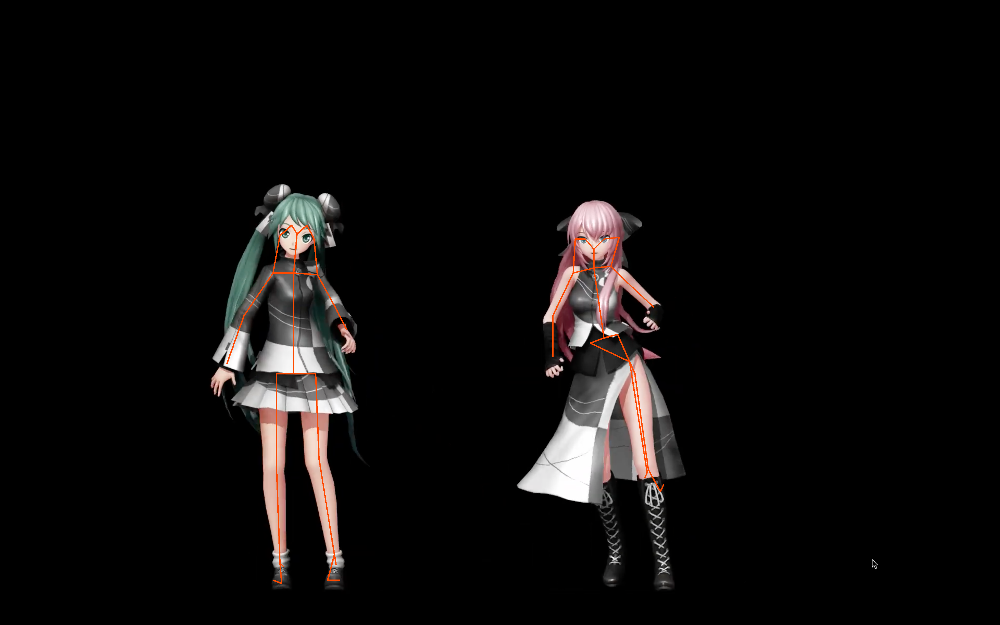

In [ ]:
# Copy images just in case
imageToRecheck = input_image.copy()

# Draw human poses on image
for pose in poses_list:
    for pair in POSE_PAIRS:
        idFrom = pair[0]
        idTo = pair[1]
        if all(pose[idFrom]) and all(pose[idTo]):
            cv2.line(imageToRecheck, pose[idFrom], pose[idTo], (0, 74, 255), 3)

# Visualize Image
cv2_imshow(imageToRecheck)

## **Pose Matching**

### **Compare Similarity Between two pose**

In [ ]:
# Import Mathematical Libraries
import math
import numpy as np
import pandas as pd
from scipy import spatial

def similarity_score(pose1, pose2):
    p1 = []
    p2 = []

    # Remove keypoints when keypoint values is none
    pose1_df = pd.DataFrame(pose1, columns=['Xp1','Yp1'])
    pose2_df = pd.DataFrame(pose2, columns=['Xp2','Yp2'])
    pose_df = pd.concat([pose1_df, pose2_df],axis = 1).dropna().reset_index(drop=True)
    pose1_df = pose_df[['Xp1','Yp1']]
    pose2_df = pose_df[['Xp2','Yp2']]

    pose1 = pose1_df.to_numpy()
    pose2 = pose2_df.to_numpy()

    pose_1 = np.array(pose1, dtype=np.float)
    pose_2 = np.array(pose2, dtype=np.float)

    # Normalize coordinates
    pose_1[:,0] = pose_1[:,0] / max(pose_1[:,0])
    pose_1[:,1] = pose_1[:,1] / max(pose_1[:,1])
    pose_2[:,0] = pose_2[:,0] / max(pose_2[:,0])
    pose_2[:,1] = pose_2[:,1] / max(pose_2[:,1])

    # Turn (16x2) into (32x1)
    for joint in range(pose_1.shape[0]):
        x1 = pose_1[joint][0]
        y1 = pose_1[joint][1]
        x2 = pose_2[joint][0]
        y2 = pose_2[joint][1]

        p1.append(x1)
        p1.append(y1)
        p2.append(x2)
        p2.append(y2)

    p1 = np.array(p1)
    p2 = np.array(p2)

    # Looking to minimize the distance if there is a match
    # Computing two different distance metrics
    cosineDistance = spatial.distance.cosine(p1, p2)
    euclideanDistance = math.sqrt(2 * cosineDistance)

    # Print Score as a output
    print("Cosine Distance:", cosineDistance)
    print("Euclidean Distance:",euclideanDistance)

In [ ]:
similarity_score(poses_list[0], poses_list[1])

Cosine Distance: 0.00274162997805405
Euclidean Distance: 0.0740490375096672


### **Visualizing Similarity Output**

In [ ]:
# Import visualization library
import matplotlib.pyplot as plt

def visualize_output(pose1, pose2, size):

    # Initialize blank canvas
    canvas = np.ones(size)

    # Plot points on images
    for pair in POSE_PAIRS:
        idFrom = pair[0]
        idTo   = pair[1]
        if all(pose1[idFrom]) and all(pose1[idTo]):
            cv2.line(canvas, pose1[idFrom], pose1[idTo], (0, 0, 255), 3)
    for pair in POSE_PAIRS:
        idFrom = pair[0]
        idTo   = pair[1]
        if all(pose2[idFrom]) and all(pose2[idTo]):
            cv2.line(canvas, pose2[idFrom], pose2[idTo], (255, 0, 0), 3)

    # Visualize images
    fig3 = plt.figure(figsize = (10,10))
    plt.imshow(canvas[:,:,::-1])
    plt.grid(True)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


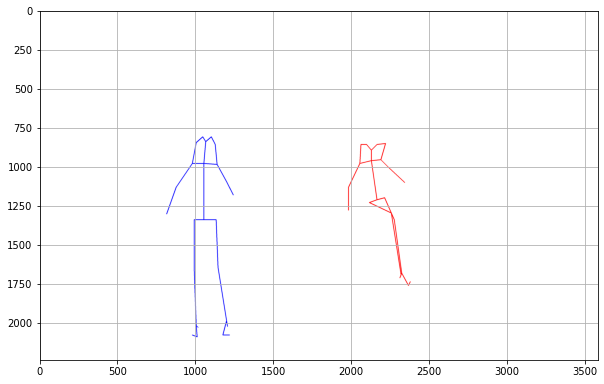

In [ ]:
visualize_output(poses_list[0], poses_list[1], input_image.shape)

### **Applying Cropping and scaling to improve cosine similarity**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Cosine Distance: 0.027789651459947384
Euclidean Distance: 0.23575263078043215


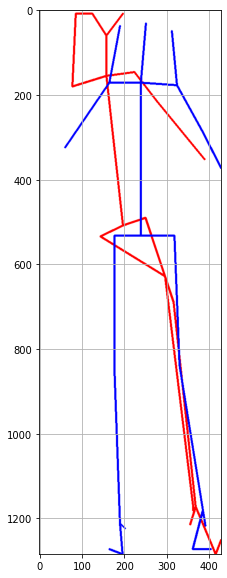

In [ ]:
# Extract poses list
pose1 = poses_list[0]
pose2 = poses_list[1]

# Corvert list to DataFrame(to handle null value)
pose1_df = pd.DataFrame(pose1, columns=['Xp1','Yp1'])
pose2_df = pd.DataFrame(pose2, columns=['Xp2','Yp2'])
pose_df = pd.concat([pose1_df, pose2_df],axis = 1)

# Cropping Pose
pose_df['Xp1'] = pose_df['Xp1'] - pose_df['Xp1'].min()
pose_df['Yp1'] = pose_df['Yp1'] - pose_df['Yp1'].min()
pose_df['Xp2'] = pose_df['Xp2'] - pose_df['Xp2'].min()
pose_df['Yp2'] = pose_df['Yp2'] - pose_df['Yp2'].min()

# Resizing Pose
resize_x = pose_df['Xp2'].max()/pose_df['Xp1'].max()
resize_y = pose_df['Yp2'].max()/pose_df['Yp1'].max()

pose_df['Xp1'] = pose_df['Xp1']*resize_x
pose_df['Yp1'] = pose_df['Yp1']*resize_y

# Get dimensions of output window
max_y = max(pose_df['Yp1'].max(), pose_df['Yp2'].max())
max_x = max(pose_df['Xp1'].max(), pose_df['Xp2'].max())
dim = (int(max_y), int(max_x), 3)

# Convert DataFrame back to Pose lists
pose1_df = pose_df[['Xp1','Yp1']]
pose2_df = pose_df[['Xp2','Yp2']]
pose1_new = [ tuple(map(int, x)) if not np.isnan(x).all()  else (None,None) for x in pose1_df.values.tolist()]
pose2_new = [ tuple(map(int, x)) if not np.isnan(x).all()  else (None,None) for x in pose2_df.values.tolist()]

# Visualize and Calculate similarity score again
visualize_output(pose1_new, pose2_new, dim)
similarity_score (pose1_new, pose2_new)

### **Applying Affine Transformation to improve cosine similarity**

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Cosine Distance: 0.009512196864551514
Euclidean Distance: 0.1379289444935436


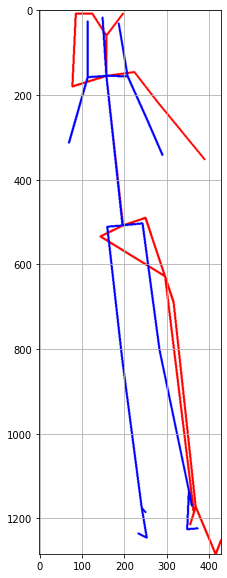

In [ ]:
reference_pose = pose1_new
relative_pose  = pose2_new
modified_pose  = []

# Function to get Affine Transformation matrix
def AffineTransform(pose1,pose2):
    q = np.array([[pose1[1][0]],[pose1[1][1]],[pose1[8][0]],[pose1[8][1]]], np.float)

    p = np.array([[pose2[1][0], pose2[1][1], 1.0, 0.0, 0.0, 0.0], \
                  [0.0, 0.0, 0.0, pose2[1][0], pose2[1][1], 1.0], \
                  [pose2[8][0], pose2[8][1], 1.0, 0.0, 0.0, 0.0], \
                  [0.0, 0.0, 0.0, pose2[8][0], pose2[8][1], 1.0]], np.float)

    A, res, rank, s = np.linalg.lstsq(p, q)

    T = np.array([[A[0], A[1], A[2]],[A[3], A[4], A[5]],[0.0, 0.0, 1.0]], np.float)

    return T

# Apply transformation on relative pose
for k in range (0,len(relative_pose)):
        if all(relative_pose[k]):
          i = relative_pose[k][0]
          j = relative_pose[k][1]
          T = AffineTransform(reference_pose,relative_pose)
          cur_pt = np.array([i,j,1])
          transformed_pt = T.dot(cur_pt)

          transformed_pt = transformed_pt / transformed_pt[2]
          modified_pose.append((int(transformed_pt[0]), int(transformed_pt[1])))
        else:
          modified_pose.append((None,None))

# Visualize and Calculate similarity score again
visualize_output(reference_pose, modified_pose, dim)
similarity_score(reference_pose, modified_pose)

# Openpose + Video Streaming Colab Implementation

## Import Dependencies and Libraries

In [ ]:
# Import dependencies
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time
import sys
import os

# Define Openpose directory destination
OpenposeDir = '/content/openpose/'

# Import Openpose dependencies
pyopenpose_dir = os.path.join(OpenposeDir,'build','python')
if pyopenpose_dir not in sys.path:
    sys.path.append(pyopenpose_dir)
from openpose import pyopenpose as op

## Webcam and Openpose Utilities

In [ ]:
# function to convert the JavaScript object into an OpenCV image
def js_to_image(js_reply):
  """
  Params:
          js_reply: JavaScript object containing image from webcam
  Returns:
          img: OpenCV BGR image
  """
  # decode base64 image
  image_bytes = b64decode(js_reply.split(',')[1])
  # convert bytes to numpy array
  jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
  # decode numpy array into OpenCV BGR image
  img = cv2.imdecode(jpg_as_np, flags=1)

  return img

# function to convert Openpose pose image into base64 byte string to be overlayed on video stream
def pose_to_bytes(pose_array):
  """
  Params:
          pose_array: Numpy array (pixels) containing pose to overlay on video stream.
  Returns:
        bytes: Base64 image byte string
  """
  # convert array into PIL image
  pose_PIL = PIL.Image.fromarray(pose_array, 'RGBA')
  iobuf = io.BytesIO()
  # format bbox into png for return
  pose_PIL.save(iobuf, format='png')
  # format return string
  pose_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))

  return pose_bytes

In [ ]:
# JavaScript to properly create our live video stream using our webcam as input
def video_stream():
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;

    var pendingResolve = null;
    var shutdown = false;

    function removeDom() {
       stream.getVideoTracks()[0].stop();
       video.remove();
       div.remove();
       video = null;
       div = null;
       stream = null;
       imgElement = null;
       captureCanvas = null;
       labelElement = null;
    }

    function onAnimationFrame() {
      if (!shutdown) {
        window.requestAnimationFrame(onAnimationFrame);
      }
      if (pendingResolve) {
        var result = "";
        if (!shutdown) {
          captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 480);
          result = captureCanvas.toDataURL('image/jpeg', 0.8)
        }
        var lp = pendingResolve;
        pendingResolve = null;
        lp(result);
      }
    }

    async function createDom() {
      if (div !== null) {
        return stream;
      }

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);

      const modelOut = document.createElement('div');
      modelOut.innerHTML = "<span>Status:</span>";
      labelElement = document.createElement('span');
      labelElement.innerText = 'No data';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);

      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      video.onclick = () => { shutdown = true; };
      stream = await navigator.mediaDevices.getUserMedia(
          {video: { facingMode: "environment"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.onclick = () => { shutdown = true; };
      div.appendChild(imgElement);

      const instruction = document.createElement('div');
      instruction.innerHTML =
          '<span style="color: red; font-weight: bold;">' +
          'When finished, click here or on the video to stop this demo</span>';
      div.appendChild(instruction);
      instruction.onclick = () => { shutdown = true; };

      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = 640; //video.videoWidth;
      captureCanvas.height = 480; //video.videoHeight;
      window.requestAnimationFrame(onAnimationFrame);

      return stream;
    }
    async function stream_frame(label, imgData) {
      if (shutdown) {
        removeDom();
        shutdown = false;
        return '';
      }

      var preCreate = Date.now();
      stream = await createDom();

      var preShow = Date.now();
      if (label != "") {
        labelElement.innerHTML = label;
      }

      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }

      var preCapture = Date.now();
      var result = await new Promise(function(resolve, reject) {
        pendingResolve = resolve;
      });
      shutdown = false;

      return {'create': preShow - preCreate,
              'show': preCapture - preShow,
              'capture': Date.now() - preCapture,
              'img': result};
    }
    ''')

  display(js)

def video_frame(label, pose):
  data = eval_js('stream_frame("{}", "{}")'.format(label, pose))
  return data

In [ ]:
from itertools import zip_longest

# Functions to get keypoints
def grouper(iterable, n, fillvalue=None):
    "Collect data into fixed-length chunks or blocks"
    args = [iter(iterable)] * n
    return list(zip_longest(*args, fillvalue=fillvalue))

def getKeypoints(net_output):
    output = []
    if (net_output is not None):
      if (len(net_output) > 0):
          for human in net_output:
              output_sub_arr = {}
              for i in range(len(human)):
                  output_sub_arr[BODY_PARTS[i]]= [int(human[i][0]),int(human[i][1])]
              output.append(output_sub_arr)
    return output

# Function to get body parts and pose pairs from model name
def getBodyAndPairs(model_type):

    if model_type == 'BODY_25':
        BODY_PARTS = op.getPoseBodyPartMapping(op.BODY_25)
        POSE_PAIRS = op.getPosePartPairs(op.BODY_25)
        POSE_PAIRS = grouper(POSE_PAIRS, 2, None)

    if model_type == 'COCO':
        BODY_PARTS = op.getPoseBodyPartMapping(op.COCO_18)
        POSE_PAIRS = op.getPosePartPairs(op.COCO_18)
        POSE_PAIRS = grouper(POSE_PAIRS, 2, None)

    if model_type == 'MPI':
        BODY_PARTS = op.getPoseBodyPartMapping(op.MPI_15)
        POSE_PAIRS = op.getPosePartPairs(op.MPI_15)
        POSE_PAIRS = grouper(POSE_PAIRS, 2, None)

    return BODY_PARTS, POSE_PAIRS


## Links to the pre-trained model of the MPII and COCO Pose dataset:
MPII Model-->http://posefs1.perception.cs.cmu.edu/OpenPose/models/pose/mpi/pose_iter_160000.caffemodel

COCO Model-->http://posefs1.perception.cs.cmu.edu/OpenPose/models/pose/coco/pose_iter_440000.caffemodel

In [ ]:
!wget http://posefs1.perception.cs.cmu.edu/OpenPose/models/pose/mpi/pose_iter_160000.caffemodel -P /content/openpose/models/pose/mpi
!wget http://posefs1.perception.cs.cmu.edu/OpenPose/models/pose/coco/pose_iter_440000.caffemodel -P /content/openpose/models/pose/coco

--2021-04-05 15:09:07--  http://posefs1.perception.cs.cmu.edu/OpenPose/models/pose/mpi/pose_iter_160000.caffemodel
Resolving posefs1.perception.cs.cmu.edu (posefs1.perception.cs.cmu.edu)... 128.2.176.37
Connecting to posefs1.perception.cs.cmu.edu (posefs1.perception.cs.cmu.edu)|128.2.176.37|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 205950363 (196M) [text/plain]
Saving to: ‘/content/openpose/models/pose/mpi/pose_iter_160000.caffemodel’

pose_iter_160000.ca 100%[===================>] 196.41M  76.9MB/s    in 2.6s    

2021-04-05 15:09:10 (76.9 MB/s) - ‘/content/openpose/models/pose/mpi/pose_iter_160000.caffemodel’ saved [205950363/205950363]

--2021-04-05 15:09:10--  http://posefs1.perception.cs.cmu.edu/OpenPose/models/pose/coco/pose_iter_440000.caffemodel
Resolving posefs1.perception.cs.cmu.edu (posefs1.perception.cs.cmu.edu)... 128.2.176.37
Connecting to posefs1.perception.cs.cmu.edu (posefs1.perception.cs.cmu.edu)|128.2.176.37|:80... connected.
HTTP reque

## Choose Openpose Model

In [ ]:
# Import Interaction Libraries
from ipywidgets import interact
import ipywidgets as widgets

# Defining OpenPose Wrapper
opWrapper = op.WrapperPython()

# Defining openpose parameters
BODY_PARTS = {}
POSE_PAIRS = []
model_isinited = False

# UI to choose Openpose Wrapper
def f(model_type):
    global public_params, opWrapper, BODY_PARTS, POSE_PAIRS, model_isinited

    # Freezing the Processing Parts
    model_isinited = False

    # Custom Params (refer to include/openpose/flags.hpp for more parameters)
    params = dict()
    params["model_folder"] = os.path.join(OpenposeDir,'models')
    params["model_pose"] = model_type
    BODY_PARTS, POSE_PAIRS = getBodyAndPairs(model_type)

    # Run Openpose Wrapper
    opWrapper.configure(params)
    opWrapper.start()

    # UnFreezing the Processing Parts
    model_isinited = True

params_widget = interact(f, model_type=['BODY_25','COCO','MPI']);

interactive(children=(Dropdown(description='model_type', options=('BODY_25', 'COCO', 'MPI'), value='BODY_25'),…

## Running Openpose On webcam

In [ ]:
# start streaming video from webcam
video_stream()
# label for video
label_html = 'Capturing...'
# initialze pose overlay to empty
pose = ''
count = 0
while True:
    js_reply = video_frame(label_html, pose)
    if not js_reply:
        break

    # reference start time of the loop
    start_time = time.time()

    # convert JS response to OpenCV Image
    img = js_to_image(js_reply["img"])

    # create transparent overlay for pose
    pose_array = np.zeros([480,640,4], dtype=np.uint8)

    # check whether model is finish loading
    if model_isinited:
        # process images
        datum = op.Datum()
        input_image = img
        imageToProcess = input_image.copy()
        datum.cvInputData = imageToProcess
        opWrapper.emplaceAndPop(op.VectorDatum([datum]))
        output_keypoints = getKeypoints(datum.poseKeypoints)

        # draw keypoints
        if(len(output_keypoints)>0):
          for pose in output_keypoints:
              pose = list(pose.values())
              pose = [(None,None) if x==[0,0] else tuple(x) for x in pose]
              for pair in POSE_PAIRS:
                  idFrom = pair[0]
                  idTo = pair[1]
                  if all(pose[idFrom]) and all(pose[idTo]):
                      cv2.line(pose_array, pose[idFrom], pose[idTo], (0, 74, 255), 3)

        # Calculate FPS
        cv2.putText(pose_array,"FPS:{}".format(round(1.0 / (time.time() - start_time),2)), (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,0,0),2)
        pose_array[:,:,3] = (pose_array.max(axis = 2) > 0 ).astype(int) * 255

    # convert overlay image into bytes
    pose_bytes = pose_to_bytes(pose_array)
    # update image so next frame gets new overlay
    pose = pose_bytes

# Openpose Detection and Matching with OpenCV Video API

## Upload Video

In [ ]:
# Change Workspace
%cd openpose

/content/openpose


In [ ]:
import os

# Define Openpose directory destination
OpenposeDir = '/content/openpose/'

# Upload Function
def upload_videos():
  from google.colab import files
  uploaded = files.upload()
  output = []
  for k, v in uploaded.items():
    open(k, 'wb').write(v)
    src = os.path.join(OpenposeDir,k)
    destination = os.path.join(OpenposeDir,'videos',k)
    os.rename(src,destination)
    output.append(destination)
  return output

videos_list = upload_videos()
videos_list

Saving video_input2.mp4 to video_input2.mp4


['/content/openpose/videos/video_input2.mp4']

## Import Dependencies and Libraries

In [ ]:
# import dependencies
from base64 import b64decode, b64encode
from google.colab.patches import cv2_imshow
import cv2
import numpy as np
import PIL
import io

# Import Openpose dependencies
import sys
# Set Openpose Directory for python api (Important)
pyopenpose_dir = os.path.join(OpenposeDir,'build','python')
if pyopenpose_dir not in sys.path:
    sys.path.append(pyopenpose_dir)
from openpose import pyopenpose as op

# Remove Unnecessary Warnings and Loggings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import logging
logger = logging.getLogger()
logger.setLevel(100)

## Opencv, Openpose and Pose Matching Utilities

In [ ]:
# Import libraries for Utilities
import math
import numpy as np
import pandas as pd
from scipy import spatial
from sklearn import preprocessing
import matplotlib.pyplot as plt
from itertools import zip_longest

def grouper(iterable, n, fillvalue=None):
    "Collect data into fixed-length chunks or blocks"
    args = [iter(iterable)] * n
    return list(zip_longest(*args, fillvalue=fillvalue))

def getKeypoints(net_output):
    output = []
    if (net_output is not None):
      if (len(net_output) > 0):
          for human in net_output:
              output_sub_arr = {}
              for i in range(len(human)):
                  output_sub_arr[BODY_PARTS[i]]= [int(human[i][0]),int(human[i][1])]
              output.append(output_sub_arr)
    return output

def convertDictToKeypointList(poses):
    output = []
    for pose in poses:
        pose = list(pose.values())
        pose = [(None,None) if x==[0,0] else tuple(x) for x in pose]
        output.append(pose)
    return output

def crop_scale_pose(pose1,pose2):

    pose1_df = pd.DataFrame(pose1, columns=['Xp1','Yp1'])
    pose2_df = pd.DataFrame(pose2, columns=['Xp2','Yp2'])
    pose_df = pd.concat([pose1_df, pose2_df],axis = 1)

    pose_df['Xp1'] = pose_df['Xp1'] - pose_df['Xp1'].min()
    pose_df['Yp1'] = pose_df['Yp1'] - pose_df['Yp1'].min()
    pose_df['Xp2'] = pose_df['Xp2'] - pose_df['Xp2'].min()
    pose_df['Yp2'] = pose_df['Yp2'] - pose_df['Yp2'].min()

    resize_x = pose_df['Xp2'].max()/pose_df['Xp1'].max()
    resize_y = pose_df['Yp2'].max()/pose_df['Yp1'].max()

    pose_df['Xp1'] = pose_df['Xp1']*resize_x
    pose_df['Yp1'] = pose_df['Yp1']*resize_y

    pose1_df = pose_df[['Xp1','Yp1']]
    pose2_df = pose_df[['Xp2','Yp2']]

    # Get dimensions of output window
    max_y = max(pose_df['Yp1'].max(), pose_df['Yp2'].max())
    max_x = max(pose_df['Xp1'].max(), pose_df['Xp2'].max())

    dim = (int(max_y), int(max_x), 3)

    pose1_new = [ tuple(map(int, x)) if not np.isnan(x).all()  else (None,None) for x in pose1_df.values.tolist()]
    pose2_new = [ tuple(map(int, x)) if not np.isnan(x).all()  else (None,None) for x in pose2_df.values.tolist()]

    return pose1_new, pose2_new, dim

def GetAffineMatrix(pose1,pose2):
    q = np.array([[pose1[1][0]],[pose1[1][1]],[pose1[8][0]],[pose1[8][1]]], np.float)

    p = np.array([[pose2[1][0], pose2[1][1], 1.0, 0.0, 0.0, 0.0], \
                  [0.0, 0.0, 0.0, pose2[1][0], pose2[1][1], 1.0], \
                  [pose2[8][0], pose2[8][1], 1.0, 0.0, 0.0, 0.0], \
                  [0.0, 0.0, 0.0, pose2[8][0], pose2[8][1], 1.0]], np.float)

    A, res, rank, s = np.linalg.lstsq(p, q)

    T = np.array([[A[0], A[1], A[2]],[A[3], A[4], A[5]],[0.0, 0.0, 1.0]], np.float)
    return T

def AffineTransform(reference_pose,relative_pose):
    modified_pose  = []
    for k in range (0,len(relative_pose)):
            if all(relative_pose[k]):
              i = relative_pose[k][0]
              j = relative_pose[k][1]
              T = GetAffineMatrix(reference_pose,relative_pose)
              cur_pt = np.array([i,j,1])
              transformed_pt = T.dot(cur_pt)

              transformed_pt = transformed_pt / transformed_pt[2]
              modified_pose.append((int(transformed_pt[0]), int(transformed_pt[1])))
            else:
              modified_pose.append((None,None))
    return modified_pose

def similarity_score(pose1, pose2):
    p1 = []
    p2 = []

    pose1_df = pd.DataFrame(pose1, columns=['Xp1','Yp1'])
    pose2_df = pd.DataFrame(pose2, columns=['Xp2','Yp2'])
    pose_df = pd.concat([pose1_df, pose2_df],axis = 1).dropna().reset_index(drop=True)
    pose1_df = pose_df[['Xp1','Yp1']]
    pose2_df = pose_df[['Xp2','Yp2']]

    pose1 = pose1_df.to_numpy()
    pose2 = pose2_df.to_numpy()

    pose_1 = np.array(pose1, dtype=np.float)
    pose_2 = np.array(pose2, dtype=np.float)

    # Normalize coordinates (Min,Max Normalization)
    pose_1[:,0] = pose_1[:,0] / max(pose_1[:,0])
    pose_1[:,1] = pose_1[:,1] / max(pose_1[:,1])
    pose_2[:,0] = pose_2[:,0] / max(pose_2[:,0])
    pose_2[:,1] = pose_2[:,1] / max(pose_2[:,1])

    # Turn (16x2) into (32x1)
    for joint in range(pose_1.shape[0]):
        x1 = pose_1[joint][0]
        y1 = pose_1[joint][1]
        x2 = pose_2[joint][0]
        y2 = pose_2[joint][1]

        p1.append(x1)
        p1.append(y1)
        p2.append(x2)
        p2.append(y2)

    p1 = np.array(p1)
    p2 = np.array(p2)

    # Looking to minimize the distance if there is a match
    # Computing two different distance metrics
    cosineDistance = spatial.distance.cosine(p1, p2)
    euclideanDistance = math.sqrt(2 * cosineDistance)
    return 1.0-cosineDistance, euclideanDistance

def visualize_output(pose1, pose2, size):

    # Initialize blank canvas
    canvas = np.ones(size)

    # Plot points on images
    for pair in POSE_PAIRS:
        idFrom = pair[0]
        idTo   = pair[1]
        if all(pose1[idFrom]) and all(pose1[idTo]):
            cv2.line(canvas, pose1[idFrom], pose1[idTo], (0, 0, 255), 3)

    for pair in POSE_PAIRS:
        idFrom = pair[0]
        idTo   = pair[1]
        if all(pose2[idFrom]) and all(pose2[idTo]):
            cv2.line(canvas, pose2[idFrom], pose2[idTo], (255, 0, 0), 3)

    # Visualize images
    fig = plt.figure(figsize = (10,10))
    plt.imshow(canvas[:,:,::-1])

    # Get Plot image array
    io_buf = io.BytesIO()
    fig.savefig(io_buf, format='rgba', dpi='figure')
    io_buf.seek(0)

    # Error Here
    img_arr = np.reshape(np.frombuffer(io_buf.getvalue(), dtype=np.uint8),
                     newshape=(int(fig.bbox.bounds[3]), int(fig.bbox.bounds[2]), -1))
    img_arr = cv2.cvtColor(img_arr,cv2.COLOR_RGBA2BGR)
    io_buf.close()
    plt.close()
    return img_arr

def save_plt_with_video(plt_img,video_frame,scale_factor):
    maxwidth = int(video_frame.shape[1]/scale_factor)
    maxheight = int(video_frame.shape[0]/scale_factor)
    f1 = maxwidth / plt_img.shape[1]
    f2 = maxheight / plt_img.shape[0]
    f = min(f1, f2)  # resizing factor
    dim = (int(plt_img.shape[1] * f), int(plt_img.shape[0] * f))
    resized_plot = cv2.resize(plt_img, dim)
    video_frame[:dim[1],:dim[0],:] = resized_plot
    return video_frame

## Write Video

In [ ]:
# Custom Params (refer to include/openpose/flags.hpp for more parameters)
params = dict()
params["model_folder"] = os.path.join(OpenposeDir,'models')

# Starting OpenPose
opWrapper = op.WrapperPython()
opWrapper.configure(params)
opWrapper.start()

# Video Read
cap = cv2.VideoCapture(videos_list[0])

# Default resolutions of the frame are obtained.The default resolutions are system dependent.
# We convert the resolutions from float to integer.
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'MP4V')
out = cv2.VideoWriter(os.path.join(OpenposeDir,'videos','output.mp4'), fourcc, fps, (frame_width,  frame_height))

# Default Body25 Openpose BODY_PARTS and POSE_PAIRS
BODY_PARTS = op.getPoseBodyPartMapping(op.BODY_25)
POSE_PAIRS = op.getPosePartPairs(op.BODY_25)
POSE_PAIRS = grouper(POSE_PAIRS, 2, None)

# Initialize variables
cosim = 100.0
eudis = 0.0
plt_image = np.zeros((10,10,3), np.uint8)

while cap.isOpened():
    # Read Image Frame
    ret, frame = cap.read()
    if ret:
        # Process Image
        datum = op.Datum()
        input_image = frame
        datum.cvInputData = input_image
        opWrapper.emplaceAndPop(op.VectorDatum([datum]))

        # Get Keypoints list
        net_output = datum.poseKeypoints
        Keypoints = getKeypoints(net_output)
        Keypoints_list = convertDictToKeypointList(Keypoints)

        try:
            # If detect multi-person
            if len(Keypoints_list) > 1:

                # Extract poses
                pose1, pose2 = Keypoints_list[0],Keypoints_list[1]

                # Cropping and Scaling poses
                pose1_new, pose2_new, dim = crop_scale_pose(pose1,pose2)

                # Visualize Cropped pose on matplotlib
                plt_image = visualize_output(pose1_new, pose2_new, dim)

                # Save Plot with Video
                video_frame = save_plt_with_video(plt_image,datum.cvOutputData,3)

                # Apply Affine Transformation
                try:
                    pose2_new = AffineTransform(pose1_new,pose2_new)
                except:
                    print("Affine Transform Failed, Bypassing Current Frame")

                # Calculate Similarity
                cosim, eudis = similarity_score(pose1_new, pose2_new)

                # Write Pose Matching Score to the Video Frame
                cv2.putText(video_frame,"Similarity Score:{}".format(round(cosim,2)),(0,int(video_frame.shape[0]*3/4)), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255),2)
                cv2.putText(video_frame,"Euclidean Distance:{}".format(round(eudis,2)),(0,int(video_frame.shape[0]*3/3.75)), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255),2)

                # Write Pose Matching Result to the Video Frame
                if cosim >= 0.99 and eudis <= 0.1:
                    cv2.putText(video_frame,"Pose Matched",(0,int(video_frame.shape[0]*3/3.5)), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0),2)
                else:
                    cv2.putText(video_frame,"Pose Not Matched",(0,int(video_frame.shape[0]*3/3.5)), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255),2)

                # Write Video Frame
                out.write(video_frame)

            else:

                # Save Plot with Video
                video_frame = save_plt_with_video(plt_image,datum.cvOutputData,3)

                # Write Pose Matching Score to the Video Frame
                cv2.putText(video_frame,"Similarity Score:{}".format(round(cosim,2)),(0,int(video_frame.shape[0]*3/4)), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255),2)
                cv2.putText(video_frame,"Euclidean Distance:{}".format(round(eudis,2)),(0,int(video_frame.shape[0]*3/3.75)), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255),2)

                # Write Pose Matching Result to the Video Frame
                if cosim >= 0.99 and eudis <= 0.1:
                    cv2.putText(video_frame,"Pose Matched",(0,int(video_frame.shape[0]*3/3.5)), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0),2)
                else:
                    cv2.putText(video_frame,"Pose Not Matched",(0,int(video_frame.shape[0]*3/3.5)), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255),2)

                # Write Video Frame
                out.write(video_frame)

        except Exception as e:
            # Catch Error
            print("Frame Extracting Error")
            print(e)
            break
    else:
        # Break when finished
        print("Frame Extracting Finished")
        break

# When everything done, release the video capture and video write objects
cap.release()
out.release()

Frame Extracting Finished


## Visualize Results

In [ ]:
def show_local_mp4_video(file_name, width=640, height=480):
  import io
  import base64
  from IPython.display import HTML
  video_encoded = base64.b64encode(io.open(file_name, 'rb').read())
  return HTML(data='''<video width="{0}" height="{1}" alt="test" controls>
                        <source src="data:video/mp4;base64,{2}" type="video/mp4" />
                      </video>'''.format(width, height, video_encoded.decode('ascii')))

show_local_mp4_video(os.path.join(OpenposeDir,'videos','output.mp4'), width=960, height=720)